# **SPORTIFY SONGS**

1.   **RESTY PUTRI SUCI YANI - 202110370311180**
2.   **KENS URGANIS AWANGSARI PUTTRISIA S. - 202110370311273**

##**INTRODUCTION**

> Dalam era digital saat ini, musik telah menjadi bagian integral dari kehidupan sehari-hari, dengan platform streaming seperti Spotify yang memungkinkan pengguna untuk mengakses jutaan lagu dari berbagai genre dan artis. Dengan meningkatnya jumlah lagu yang dirilis setiap hari, penting bagi produser musik, pemasar, dan kurator playlist untuk memahami faktor-faktor yang mempengaruhi popularitas lagu. Analisis data lagu Spotify dapat memberikan wawasan berharga tentang preferensi pendengar, distribusi genre, dan hubungan antara fitur audio dengan popularitas lagu.

> Dataset yang digunakan dalam analisis ini mencakup berbagai variabel, termasuk skor popularitas lagu, nama lagu, artis, genre, durasi, dan fitur audio seperti energi, danceability, dan tempo. Melalui pembersihan dan pengolahan data yang cermat, kami akan memastikan bahwa analisis yang dilakukan adalah akurat dan dapat diandalkan. Analisis ini diharapkan dapat memberikan wawasan yang dapat ditindaklanjuti bagi para pemangku kepentingan di industri musik, membantu mereka dalam merumuskan strategi promosi yang lebih efektif dan dalam pembuatan playlist yang sesuai dengan preferensi pendengar. Dengan memahami hubungan antara fitur audio dan popularitas, serta distribusi genre, para pemangku kepentingan dapat membuat keputusan yang lebih baik terkait promosi musik dan pembuatan playlist.





##**PROBLEM STATEMENT**

> Tujuan utama dari proyek ini adalah untuk menganalisis dataset lagu Spotify guna mengungkap wawasan terkait popularitas lagu, distribusi genre, dan hubungan antara berbagai fitur audio dengan popularitas lagu. Analisis ini bertujuan untuk memberikan wawasan yang dapat ditindaklanjuti bagi produser musik, pemasar, dan .kurator playlist untuk meningkatkan strategi mereka dalam promosi lagu dan pembuatan playlist.





##**BUSINESS OBJECTIVES**


> *   Memahami Faktor Popularitas: Mengidentifikasi fitur audio (misalnya, energi, danceability) yang secara signifikan mempengaruhi popularitas lagu.
*   Analisis Genre: Menganalisis distribusi lagu di berbagai genre dan subgenre untuk memahami preferensi pendengar.
*   Optimasi Playlist: Memberikan wawasan tentang genre dan subgenre yang paling populer, membantu dalam pembuatan playlist yang efektif.
*   Tren Rilis: Memeriksa tren dalam rilis album dari waktu ke waktu untuk mengidentifikasi periode puncak untuk musik baru.




## **INSTALL LIBRARY**

## **IMPORT LIBRARY**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from google.colab import drive
from scipy.stats import norm

import warnings
warnings.filterwarnings('ignore')

## **SETUP DATASET**

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path='/content/drive/MyDrive/Project Analisis Big Data/spotify/spotify_songs.csv'
df=pd.read_csv(path)

##**DATA PREPARATION**

> Dataset yang digunakan dalam analisis ini diambil dari [lSportify_Songs](https://raw.githubusercontent.com/rfordatascience/tidytuesday/main/data/2020/2020-01-21/spotify_songs.csv). Dataset ini berisi informasi tentang lagu-lagu yang ada di Spotify, termasuk berbagai fitur audio dan metadata terkait.

> Dataset ini bertujuan untuk memberikan informasi tentang lagu-lagu di Sportify, termasuk popularitas, genre, dan fitur audio yang dapat digunakan untuk analisis lebih lanjut. Data ini dikumpulkan pada Januari 2020. Serta memiliki 17 variabel, termasuk informasi tentang nama lagu, artis, popularitas, genre, dan fitur audio. Beberapa kolom mungkin memiliki nilai yang hilang, dan beberapa fitur audio dinyatakan dalam skala tertentu (misal, 0-1 untuk energi dan danceability.





##**VARIABLES INFORMATION**

> *   track_popularity: Skor popularitas lagu (0-100).
*   track_name: Nama lagu.
*   track_artist: Artis dari lagu.
*   track_album_name: Nama album.
*   track_album_release_date: Tanggal rilis album.
*   playlist_genre: Genre dari playlist.
*   playlist_subgenre: Subgenre dari playlist.
*   duration_ms: Durasi lagu dalam milidetik.
*   energy: Tingkat energi lagu (0-1).
*   danceability: Skor danceability (0-1).
*   loudness: Kerasnya lagu dalam desibel.
*   tempo: Tempo lagu dalam ketukan per menit (BPM).
*   acousticness: Skor akustik (0-1).
*   instrumentalness: Skor instrumental (0-1).
*   valence: Skor valensi (0-1).
*   speechiness: Skor speechiness (0-1).
*   liveness: Skor liveness (0-1).









## **LOAD DATASET**

In [ ]:
df

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


In [ ]:
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [ ]:
df.tail()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432
32832,29zWqhca3zt5NsckZqDf6c,Typhoon - Original Mix,Julian Calor,27,0X3mUOm6MhxR7PzxG95rAo,Typhoon/Storm,2014-03-03,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,5,-4.571,0,0.0385,0.000133,0.341000,0.7420,0.0894,127.984,337500


In [ ]:
df.shape

(32833, 23)

In [ ]:
df.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

## **PREPROCESSING**

### MISSING VALUES

In [ ]:
# check missing values pd dataset
null_df = pd.DataFrame(df.isna().sum()).rename(columns={0: 'number_of_nulls_values'})
null_df

,number_of_nulls_values
track_id,0
track_name,5
track_artist,5
track_popularity,0
track_album_id,0
track_album_name,5
track_album_release_date,0
playlist_name,0
playlist_id,0
playlist_genre,0


Text(0.5, 1.0, 'Visualisasi Missing Values')

<Figure size 1000x500 with 0 Axes>

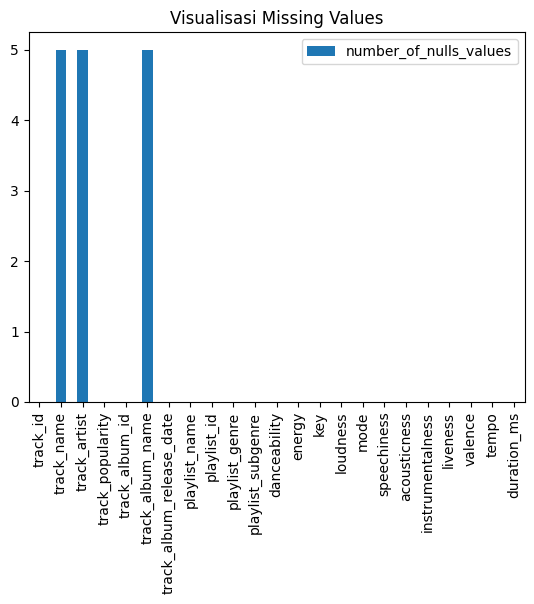

In [ ]:
# visualisasi missing values
plt.figure(figsize=(10, 5))
null_df.plot(kind='bar')
plt.title('Visualisasi Missing Values')

In [ ]:
# persen missing values
percentage_null_df = pd.DataFrame(round(df.isna().sum()*100/len(df), 4)).rename(columns={0: 'percentage_null_values'})
percentage_null_df

,percentage_null_values
track_id,0.0000
track_name,0.0152
track_artist,0.0152
track_popularity,0.0000
track_album_id,0.0000
track_album_name,0.0152
track_album_release_date,0.0000
playlist_name,0.0000
playlist_id,0.0000
playlist_genre,0.0000


In [ ]:
# check kategori fitur yang memiliki nilai 0
df.playlist_genre.value_counts()

,count
playlist_genre,
edm,6043
rap,5746
pop,5507
r&b,5431
latin,5155
rock,4951


In [ ]:
df.track_artist.value_counts()

,count
track_artist,
Martin Garrix,161
Queen,136
The Chainsmokers,123
David Guetta,110
Don Omar,102
...,...
Underworld,1
The Witches,1
Tess Parks,1


In [ ]:
df.playlist_subgenre.value_counts()

,count
playlist_subgenre,
progressive electro house,1809
southern hip hop,1675
indie poptimism,1672
latin hip hop,1656
neo soul,1637
pop edm,1517
electro house,1511
hard rock,1485
gangster rap,1458


In [ ]:
df.track_album_name.value_counts()

,count
track_album_name,
Greatest Hits,139
Ultimate Freestyle Mega Mix,42
Gold,35
Malibu,30
Rock & Rios (Remastered),29
...,...
A Mouthful,1
Blonde comme moi,1
Every Second Counts,1


In [ ]:
df.track_name.value_counts()

,count
track_name,
Poison,22
Breathe,21
Alive,20
Forever,20
Stay,19
...,...
Quien Eres Tu,1
Como Nadie,1
Ya No Estás Aquí,1


In [ ]:
# Hapus variabel yang memiliki nilai 0 lebih dari 50%
df.drop(columns='playlist_genre', inplace=True)

In [ ]:
# Ganti nilai null dengan nilai paling sering dlm 1 variabel
df['track_artist']=df['track_artist'].fillna(df['track_artist'].mode()[0])
df['playlist_subgenre']=df['playlist_subgenre'].fillna(df['playlist_subgenre'].mode()[0])
df['track_album_name']=df['track_album_name'].fillna(df['track_album_name'].mode()[0])
df['track_name']=df['track_name'].fillna(df['track_name'].mode()[0])

In [ ]:
# check nilai null telah dihapus
df.isna().sum()

,0
track_id,0
track_name,0
track_artist,0
track_popularity,0
track_album_id,0
track_album_name,0
track_album_release_date,0
playlist_name,0
playlist_id,0
playlist_subgenre,0


In [ ]:
df.shape

(32833, 22)

### HANDLING OUTIERS

In [ ]:
# Variabel Kategori
categorical_variables = [i for i in df.columns if df[i].dtypes == 'object' or df[i].dtypes.name == 'category']
print(f'Dataset memiliki {len(categorical_variables)} variabel kategori')
print('--'*39)
print(categorical_variables)

Dataset memiliki 9 variabel kategori
------------------------------------------------------------------------------
['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_subgenre']


In [ ]:
# Variabel Numerik
numerical_variables = [i for i in df.columns if df[i].dtypes !='object']
print(f'Ada {len(numerical_variables)} variabel numerik')
print('--'*39)
print(numerical_variables)

Ada 13 variabel numerik
------------------------------------------------------------------------------
['track_popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']


In [ ]:
# Variabel Diskrit - variabel yang kurang dari 150 kategori, dapat dr var. numerik
descrete_variables = []
for i in numerical_variables:
  if len(df[i].value_counts())<=150:
    descrete_variables.append(i)
    print(i, ':', df[i].unique())
    print('__'*39)
  else:
    pass

print(f'Dataset memiliki {len(descrete_variables)} variabel diskrit')

track_popularity : [ 66  67  70  60  69  62  68  58  63  65  35  64   8  30  56  55  59  87
  83  61  57  53  34  74  46  52  45  51  48  39  71  81  85  76  75  73
  79  16  84  37  36  72  77  82  41   5  24  18  47  80  96  86  19  27
  43  91  42  21  54   9  23  40   2  11  50  10  49   6  25  95   1   4
  28  29  38  17  31  26  32  12  44   7   0  13  78  88  94  22  98  97
  90  93  92   3  33  20  14  15  89 100  99]
______________________________________________________________________________
key : [ 6 11  1  7  8  5  4  2  0 10  9  3]
______________________________________________________________________________
mode : [1 0]
______________________________________________________________________________
Dataset memiliki 3 variabel diskrit


In [ ]:
# Variabel Kontinu de var. numerik
contineous_variables = [i for i in numerical_variables if i not in descrete_variables]
print(f'Dataset memiliki {len(contineous_variables)} variabel kontinu')
print('--'*39)
print(contineous_variables)

Dataset memiliki 10 variabel kontinu
------------------------------------------------------------------------------
['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']


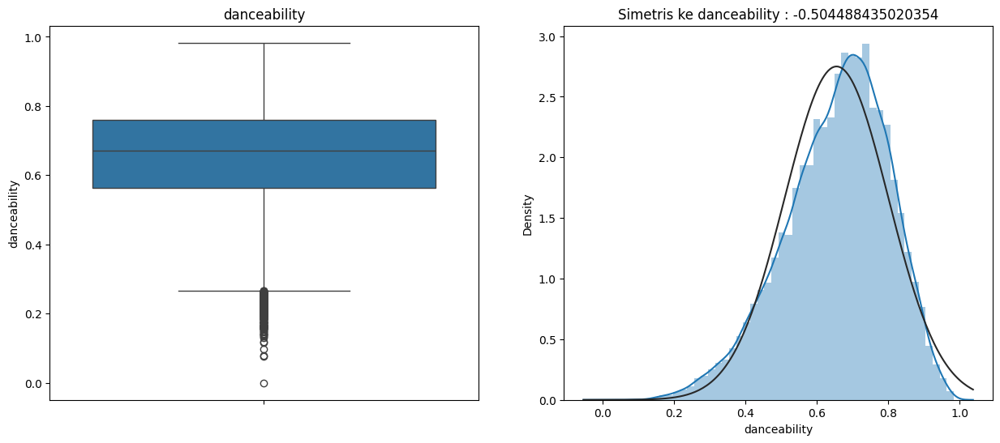

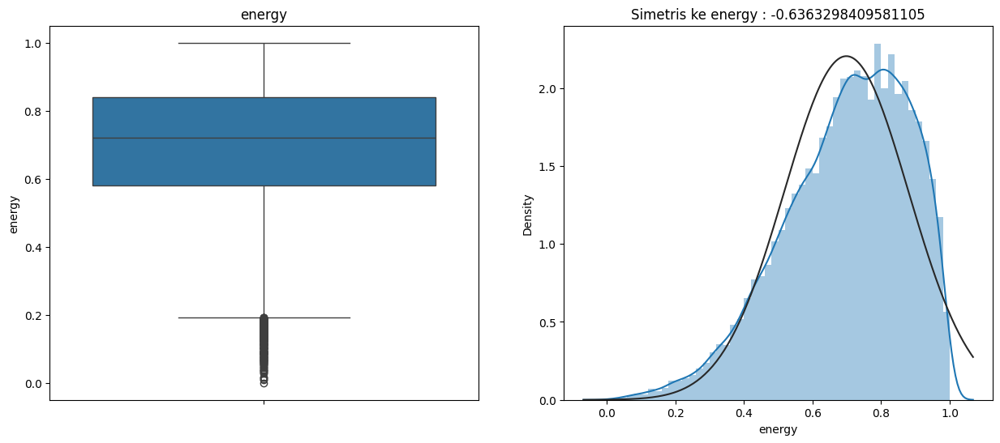

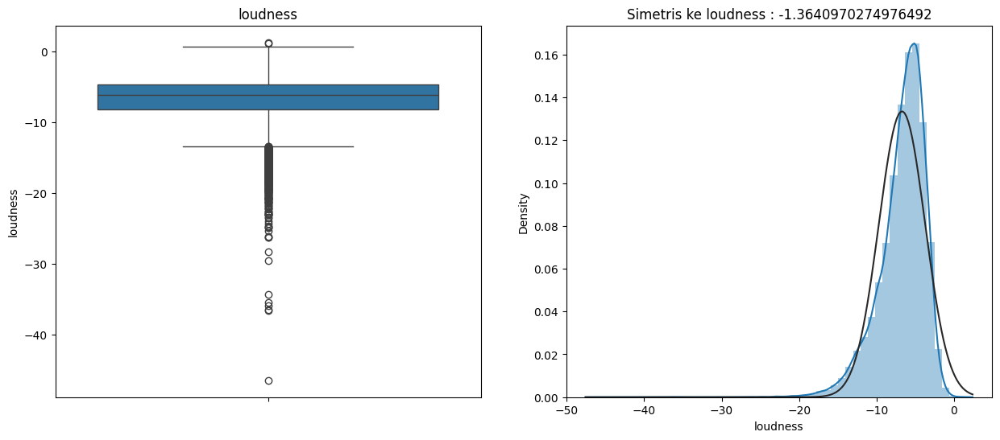

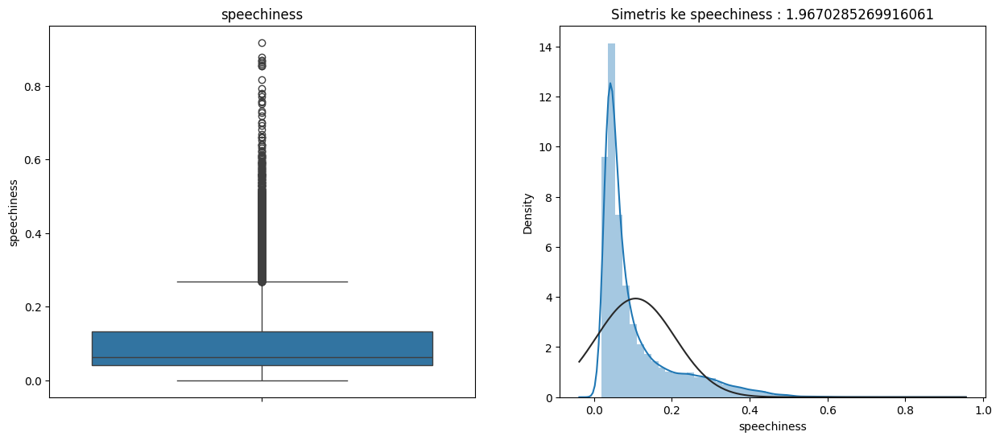

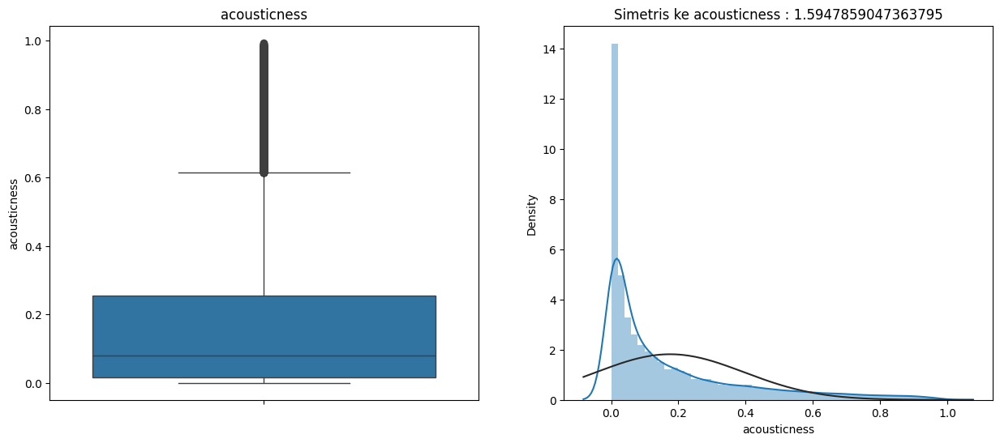

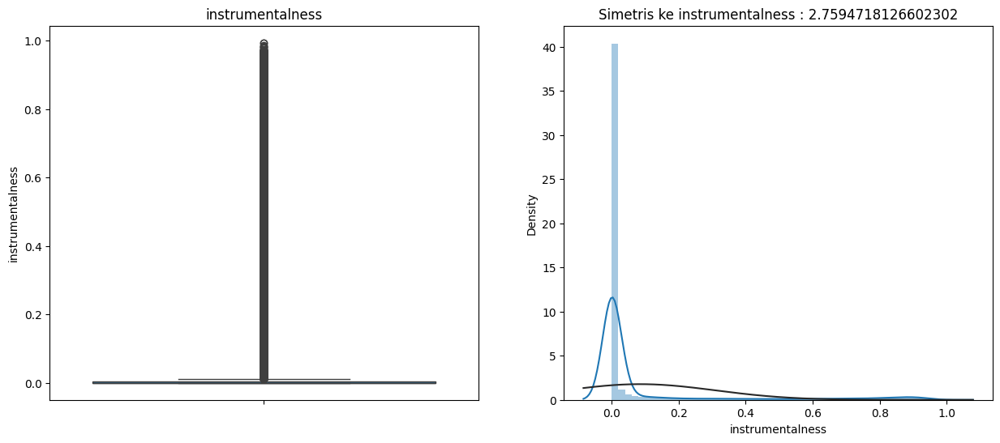

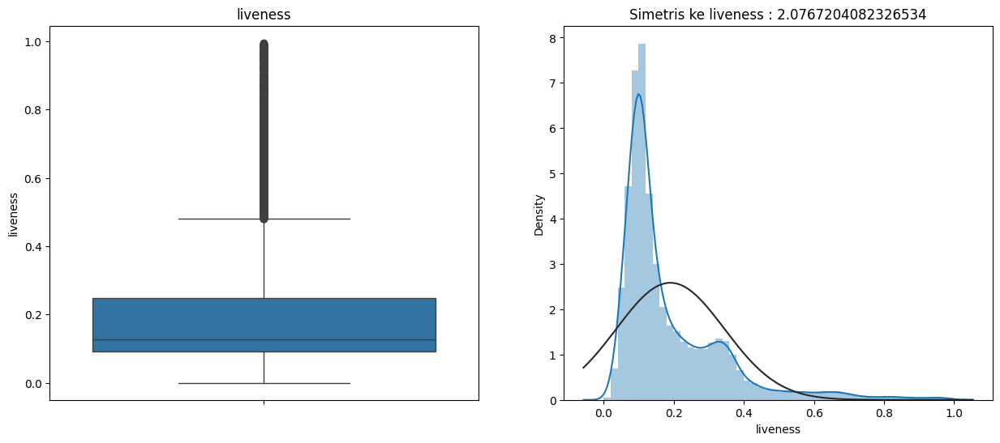

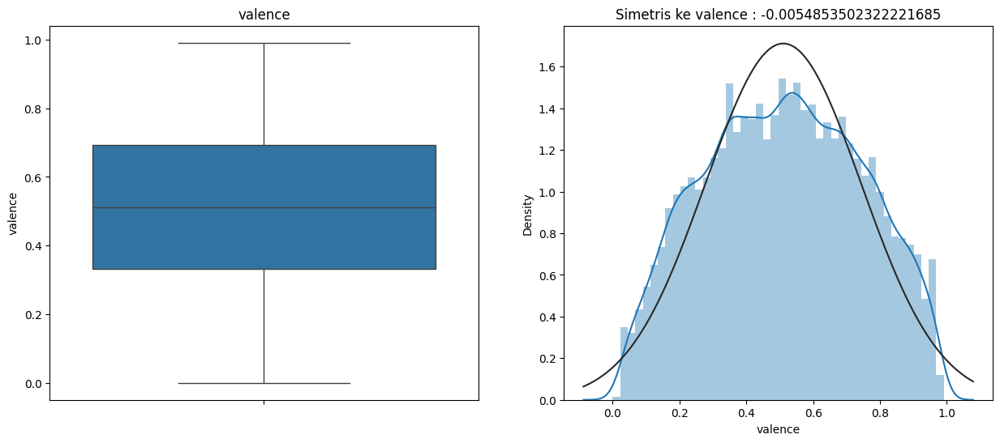

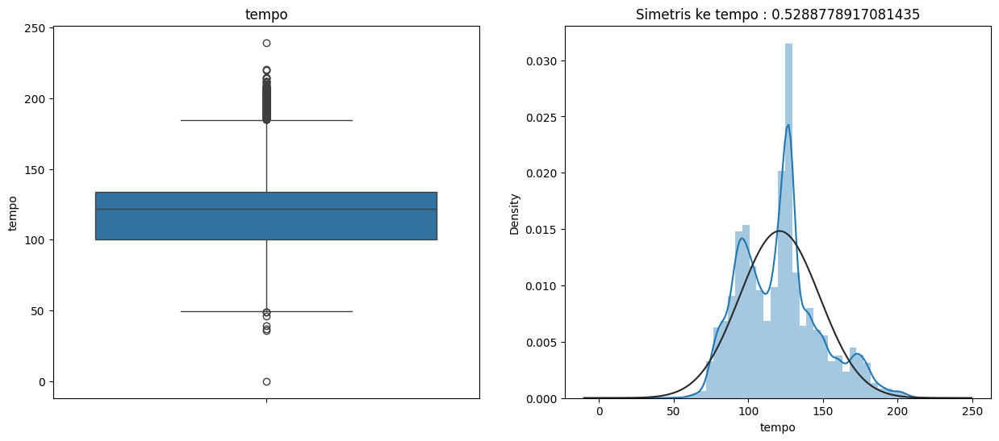

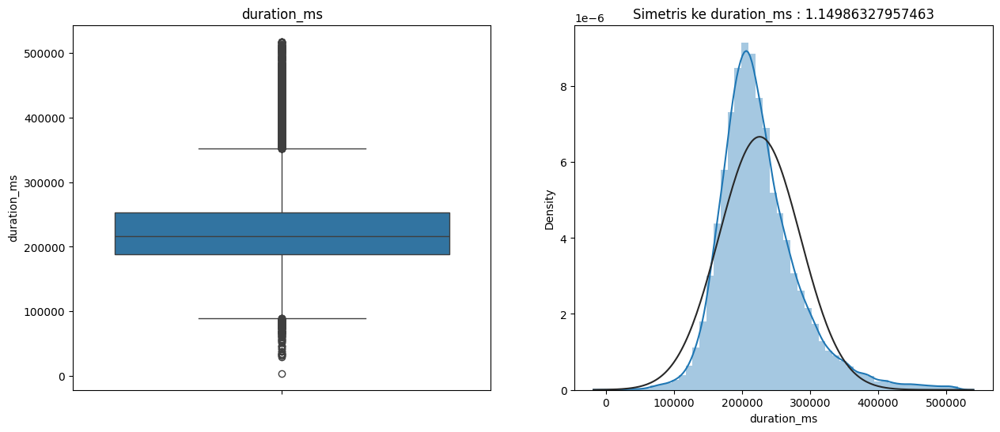

In [ ]:
# Check outlier untuk var. kontinu
for i in contineous_variables:
  plt.figure(figsize=(15, 6))
  plt.subplot(1, 2, 1)
  ax=sns.boxplot(data=df[i])
  ax.set_title(f'{i}')
  ax.set_ylabel(i)

  plt.subplot(1, 2, 2)
  ax=sns.distplot(df[i], fit=norm)
  ax.set_title(f'Simetris ke {i} : {df[i].skew()}')
  ax.set_xlabel(i)
  plt.show()

In [ ]:
# Rentang inter kuartil utk menghindari outlier

# Kolom yang relevan untuk menangani outliers
outliers_columns = ['track_popularity', 'tempo', 'loudness']  # Sesuaikan sesuai dataset

# Salin dataset asli untuk dimodifikasi
new_df = df.copy()

# Menangani outliers dengan metode IQR
for col in outliers_columns:
    # Menghitung IQR
    Q1 = new_df[col].quantile(0.25)
    Q3 = new_df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Menentukan batas bawah dan atas
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Memangkas nilai outlier
    new_df.loc[new_df[col] > upper_limit, col] = upper_limit
    new_df.loc[new_df[col] < lower_limit, col] = lower_limit


____________________________________________________________________________________________________


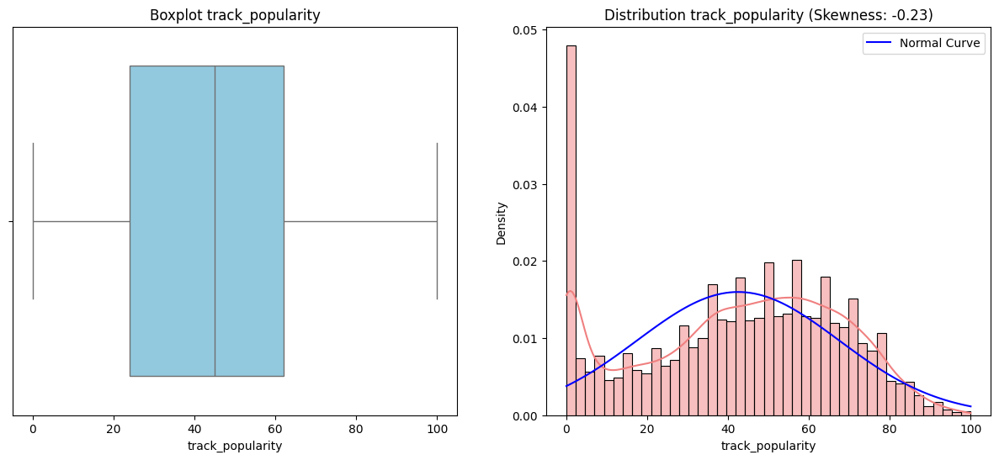

____________________________________________________________________________________________________


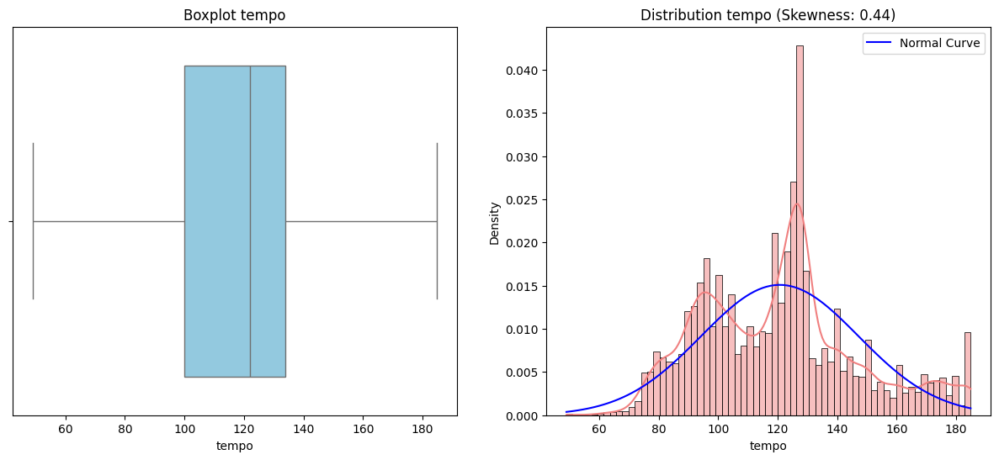

____________________________________________________________________________________________________


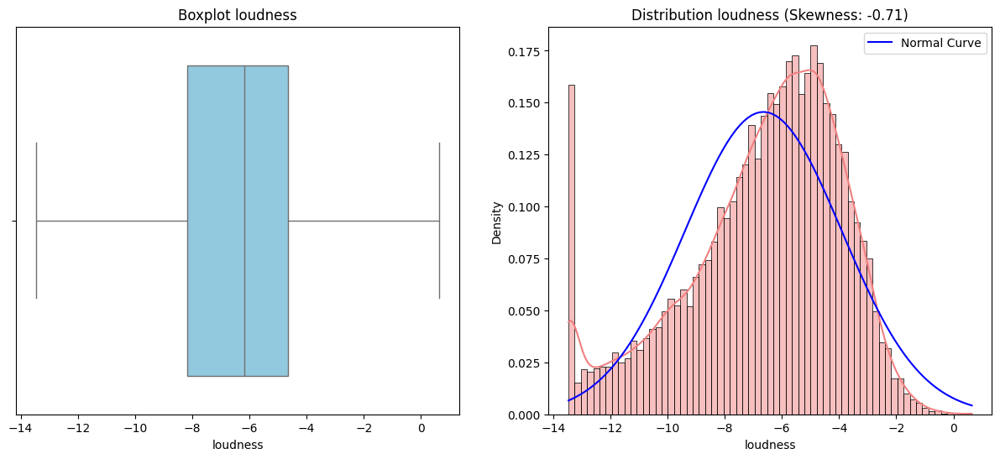

In [ ]:
# Loop untuk setiap kolom dalam outliers_columns
for i in outliers_columns:
    plt.figure(figsize=(15, 6))

    # Plot Boxplot
    plt.subplot(1, 2, 1)
    ax = sns.boxplot(x=new_df[i], color="skyblue")
    ax.set_title(f'Boxplot {i}')
    ax.set_xlabel(i)

    # Plot Distribution Plot dengan Skewness
    plt.subplot(1, 2, 2)
    ax = sns.histplot(new_df[i], kde=True, color="lightcoral", stat="density")
    sns.lineplot(x=np.linspace(new_df[i].min(), new_df[i].max(), 100),
                 y=norm.pdf(np.linspace(new_df[i].min(), new_df[i].max(), 100),
                            loc=new_df[i].mean(),
                            scale=new_df[i].std()),
                 color="blue", label="Normal Curve")
    ax.set_title(f'Distribution {i} (Skewness: {new_df[i].skew():.2f})')
    ax.set_xlabel(i)
    plt.legend()

    print('__' * 50)
    plt.show()

In [ ]:
new_df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.646406,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.715919,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.741297,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.442827,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-13.460000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,49.023000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,0.644000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,184.855000,517810.000000


### DATA WRANGLING N FEATURE

In [ ]:
new_df

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_subgenre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,progressive electro house,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,progressive electro house,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,progressive electro house,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,progressive electro house,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


In [ ]:
# Menampilkan nilai unik di setiap kolom dengan batasan jumlah nilai yang ditampilkan

for i in new_df.columns:
    unique_values = new_df[i].unique()  # nilai unik
    unique_count = len(unique_values)  # jumlah nilai unik

    print(f'Kolom: {i}')
    print(f'Jumlah Nilai Unik: {unique_count}')

    # Batasi jumlah nilai unik yang ditampilkan (contoh: maksimum 10 nilai)
    if unique_count <= 10:
        print(f'Nilai Unik: {unique_values}')
    else:
        print(f'Nilai Unik (Contoh 10): {unique_values[:10]}...')  # 10 nilai pertama

    print('__' * 50)


Kolom: track_id
Jumlah Nilai Unik: 28356
Nilai Unik (Contoh 10): ['6f807x0ima9a1j3VPbc7VN' '0r7CVbZTWZgbTCYdfa2P31'
 '1z1Hg7Vb0AhHDiEmnDE79l' '75FpbthrwQmzHlBJLuGdC7'
 '1e8PAfcKUYoKkxPhrHqw4x' '7fvUMiyapMsRRxr07cU8Ef'
 '2OAylPUDDfwRGfe0lYqlCQ' '6b1RNvAcJjQH73eZO4BLAB'
 '7bF6tCO3gFb8INrEDcjNT5' '1IXGILkPm0tOCNeq00kCPa']...
____________________________________________________________________________________________________
Kolom: track_name
Jumlah Nilai Unik: 23449
Nilai Unik (Contoh 10): ["I Don't Care (with Justin Bieber) - Loud Luxury Remix"
 'Memories - Dillon Francis Remix' 'All the Time - Don Diablo Remix'
 'Call You Mine - Keanu Silva Remix'
 'Someone You Loved - Future Humans Remix'
 'Beautiful People (feat. Khalid) - Jack Wins Remix'
 'Never Really Over - R3HAB Remix'
 'Post Malone (feat. RANI) - GATTÜSO Remix'
 'Tough Love - Tiësto Remix / Radio Edit'
 "If I Can't Have You - Gryffin Remix"]...
_____________________________________________________________________________________

In [ ]:
# check data baru setelah outlier dihapus
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32833 non-null  object 
 2   track_artist              32833 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32833 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_subgenre         32833 non-null  object 
 10  danceability              32833 non-null  float64
 11  energy                    32833 non-null  float64
 12  key                       32833 non-null  int64  
 13  loudness                  32833 non-null  float64
 14  mode  

In [ ]:
# Ubah kolom track_album_release_date ke format datetime64
new_df['track_album_release_date'] = pd.to_datetime(new_df['track_album_release_date'], format='%Y-%m-%d', errors='coerce')
print(new_df.dtypes)

track_id                            object
track_name                          object
track_artist                        object
track_popularity                     int64
track_album_id                      object
track_album_name                    object
track_album_release_date    datetime64[ns]
playlist_name                       object
playlist_id                         object
playlist_subgenre                   object
danceability                       float64
energy                             float64
key                                  int64
loudness                           float64
mode                                 int64
speechiness                        float64
acousticness                       float64
instrumentalness                   float64
liveness                           float64
valence                            float64
tempo                              float64
duration_ms                          int64
dtype: object


In [ ]:
new_df[['track_album_release_date']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 1 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   track_album_release_date  30947 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 256.6 KB


In [ ]:
# hitung popularitas rata-rata utk stiap genre
new_df = df.copy()
new_df['avg_popularity_by_genre'] = new_df.groupby('playlist_subgenre')['track_popularity'].transform('mean')

# add durasi dlm menit
new_df['duration_minutes'] = new_df['duration_ms'] / 60000

# add kolom kategori popularitas
new_df['popularity_category'] = np.where(new_df['track_popularity'] >=80, 'high',
                                         np.where(new_df['track_popularity'] >= 50, 'medium', 'low'))

# add kolom utk cek lagu rilis sblm/ssdah th 2000
new_df['released_pre_2000'] = np.where(
    pd.to_datetime(new_df['track_album_release_date'], errors='coerce', format='%Y-%m-%d', dayfirst=True).dt.year < 2000,
    'yes', 'no')

# add kolom kategory berdasar 'energy'
new_df['energy_category'] = np.where(new_df['energy'] >= 0.8, 'high',
                                     np.where(new_df['energy'] >= 0.5, 'medium', 'low'))

# add kolom cek lagu durasi > 3 menit
new_df['is_long_track'] = np.where(new_df['duration_minutes'] > 3, 'yes', 'no')

# cek dataset
new_df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_subgenre,...,liveness,valence,tempo,duration_ms,avg_popularity_by_genre,duration_minutes,popularity_category,released_pre_2000,energy_category,is_long_track
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,0.0653,0.518,122.036,194754,52.079353,3.245900,medium,no,high,yes
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,0.3570,0.693,99.972,162600,52.079353,2.710000,medium,no,high,no
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,0.1100,0.613,124.008,176616,52.079353,2.943600,medium,no,high,no
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,0.2040,0.277,121.956,169093,52.079353,2.818217,medium,no,high,no
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,dance pop,...,0.0833,0.725,123.976,189052,52.079353,3.150867,medium,no,high,yes


In [ ]:
new_df.shape

(32833, 28)

In [ ]:
# hapus observasi dg nilai 0
new_df.drop(new_df[new_df['track_popularity'] == 0].index, inplace=True)

In [ ]:
new_df.shape

(30130, 28)

In [ ]:
# check inform dataset baru
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30130 entries, 0 to 32832
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  30130 non-null  object 
 1   track_name                30130 non-null  object 
 2   track_artist              30130 non-null  object 
 3   track_popularity          30130 non-null  int64  
 4   track_album_id            30130 non-null  object 
 5   track_album_name          30130 non-null  object 
 6   track_album_release_date  30130 non-null  object 
 7   playlist_name             30130 non-null  object 
 8   playlist_id               30130 non-null  object 
 9   playlist_subgenre         30130 non-null  object 
 10  danceability              30130 non-null  float64
 11  energy                    30130 non-null  float64
 12  key                       30130 non-null  int64  
 13  loudness                  30130 non-null  float64
 14  mode       

In [ ]:
# konversi dtype ke int64
new_df['track_popularity'] = new_df['track_popularity'].astype('int64')
new_df['duration_ms'] = new_df['duration_ms'].astype('int64')

In [ ]:
# periksa dtype konversi
new_df[['track_popularity', 'duration_ms']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 30130 entries, 0 to 32832
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   track_popularity  30130 non-null  int64
 1   duration_ms       30130 non-null  int64
dtypes: int64(2)
memory usage: 706.2 KB


## **EXPLORATORY DATA ANALYSIS (EDA)**

> Dalam analisis ini mencakup 3 analisis, yakni unvariate, bivariate, dan multivariate. Hasil analisis dari unvariate yakni berupa sebagian besar lagu memiliki popularitas di bawah 50, dengan beberapa lagu mencapai popularitas tinggi di atas 80. Sedangkan bivariate menunjukkan bahwa lagu dengan energi dan danceability tinggi cenderung memiliki popularitas yang lebih tinggi. Selain dua analisis itu, ada juga analisis multivariate yang mana menunjukkan bahwa genre tertentu, seperti pop dan hip-hop yang memiliki rata-rata popularitas lebih tinggi dibanding genre lain.

> Disini juga terdapat sajian temuan dalam bentuk grafik dan tabel untuk memudahkan pemahaman. Setiap grafik dilengkapi dengan judul yang jelas, label sumbu, dan lain sebagainya. Tabel juga disajikan dengan rancangan untuk memudahkan perbandingan informasi penting, dengan gaya yang cermat untuk menyoroti fitur penting.





### UNIVARIATE ANALYSIS

In [ ]:
# variabel target
excluded_variables = [var for var in new_df.columns if len(new_df[var].value_counts()) > 15]
target_variables = [var for var in new_df.columns if var not in excluded_variables]

In [ ]:
# definisi r utk jumlah dan uk. plot
r = int(len(target_variables) / 3 + 1)

In [ ]:
# def fungsi utk anotasi % pd plot batang
def annot_percent(plot):
  '''Menerima Plot sebagai Input dan Add Anotasi % pada Setiap Batang di CountPlot'''
  for p in plot.patches:
    total = sum(p.get_height() for p in plot.patches) / 100
    percent = round((p.get_height() / total), 2)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    plot.annotate(f'{percent}%', (x, y), ha='center', va='bottom')

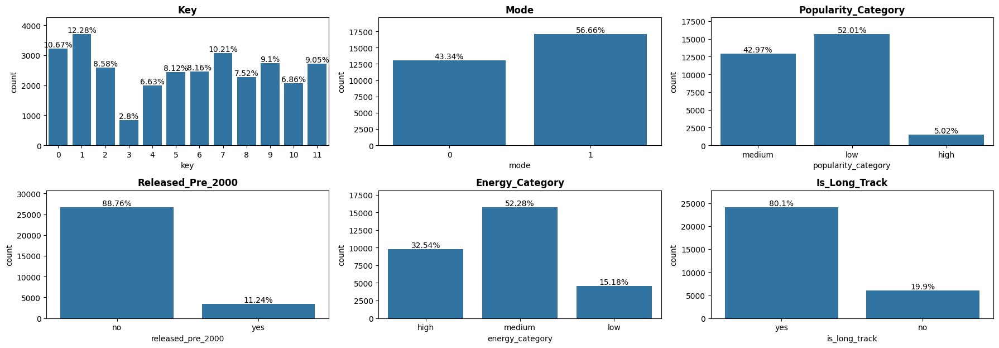

In [ ]:
# plot countplot tiap variabel
plt.figure(figsize=(18, r * 3))
for n, var in enumerate(target_variables):
  plot = plt.subplot(r, 3, n + 1)
  sns.countplot(x=new_df[var], ax=plot).margins(y=0.15)
  plt.title(f'{var.title()}', weight='bold')
  plt.tight_layout()
  annot_percent(plot)

### BIVARIATE ANALYSIS

#### 1. Berapa banyak playlist yang ada di setiap subgenre?

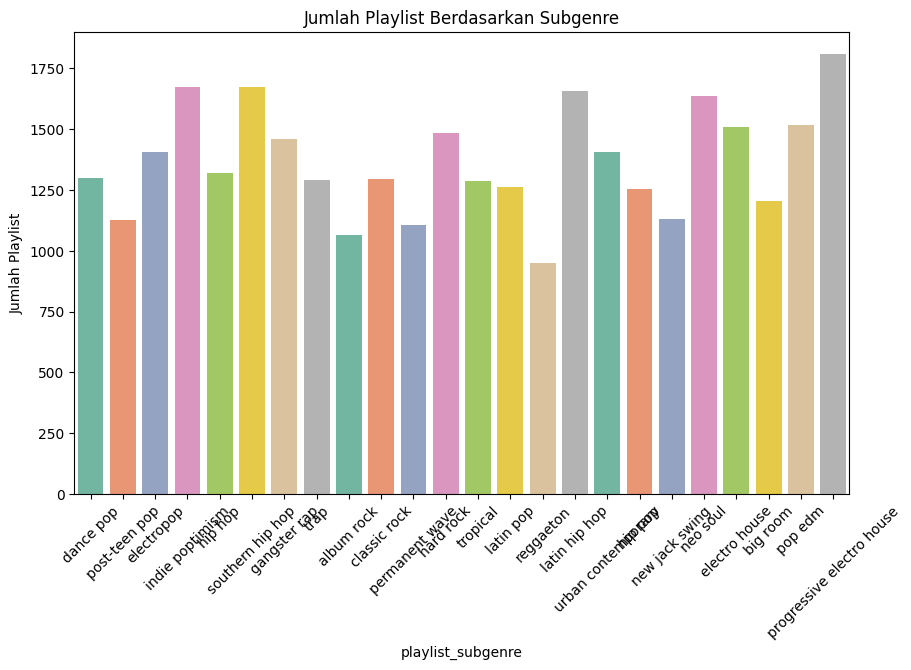

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='playlist_subgenre', palette='Set2')
plt.title('Jumlah Playlist Berdasarkan Subgenre')
plt.xticks(rotation=45)
plt.ylabel('Jumlah Playlist')
plt.show()

#### 2. Apakah tinggi "energy" atau "danceability" berhubungan dengan popularitas lagu?

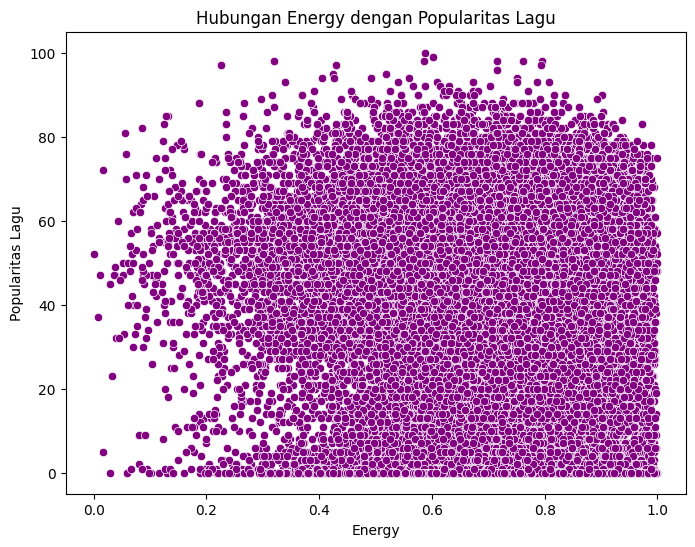

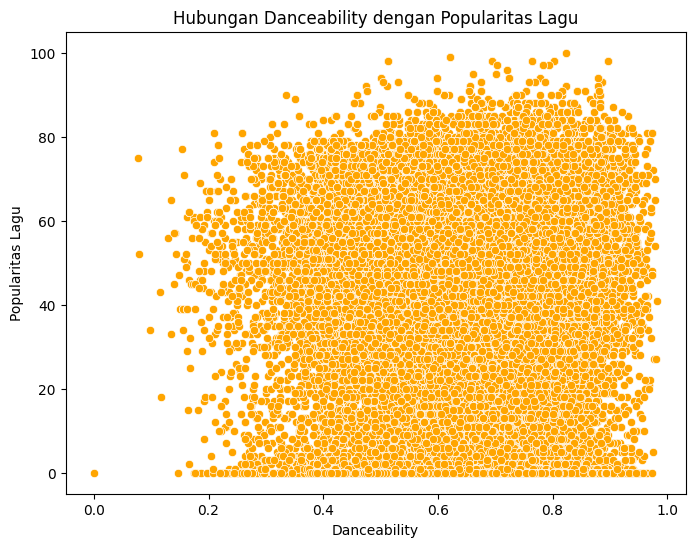

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='energy', y='track_popularity', color='purple')
plt.title('Hubungan Energy dengan Popularitas Lagu')
plt.xlabel('Energy')
plt.ylabel('Popularitas Lagu')
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='danceability', y='track_popularity', color='orange')
plt.title('Hubungan Danceability dengan Popularitas Lagu')
plt.xlabel('Danceability')
plt.ylabel('Popularitas Lagu')
plt.show()

#### 3. Berapa lama durasi lagu yang paling umum?

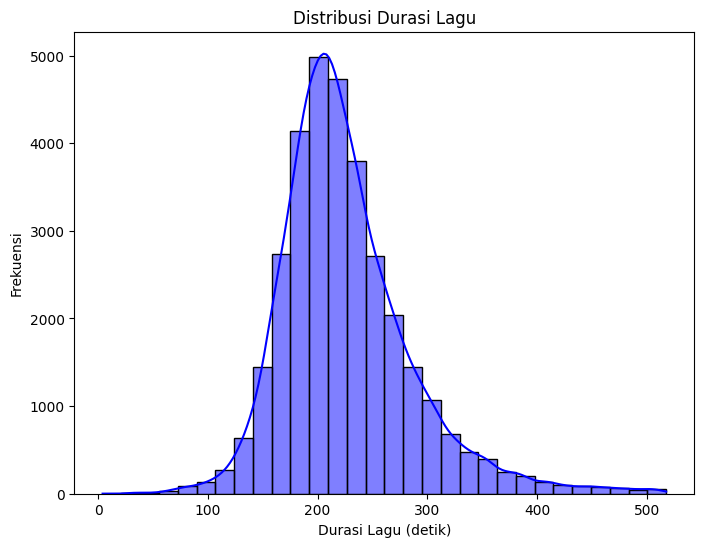

In [ ]:
plt.figure(figsize=(8,6))
sns.histplot(df['duration_ms'] / 1000, kde=True, color='blue', bins=30)
plt.title('Distribusi Durasi Lagu')
plt.xlabel('Durasi Lagu (detik)')
plt.ylabel('Frekuensi')
plt.show()

#### 4. Jenis playlist mana yang paling banyak memiliki lagu dengan popularitas tinggi?

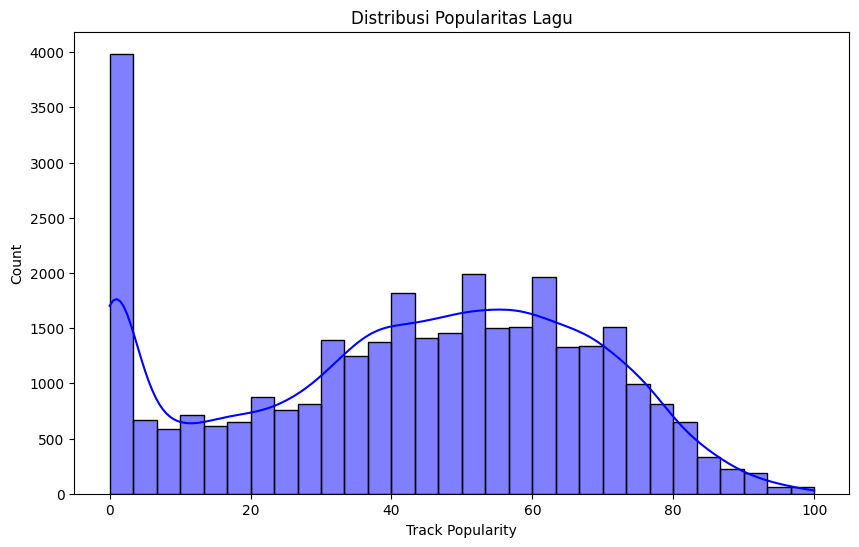

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['track_popularity'], bins=30, kde=True, color='blue')
plt.title('Distribusi Popularitas Lagu')
plt.xlabel('Track Popularity')
plt.ylabel('Count')
plt.show()

#### 5. Subgenre playlist mana yang paling banyak muncul?

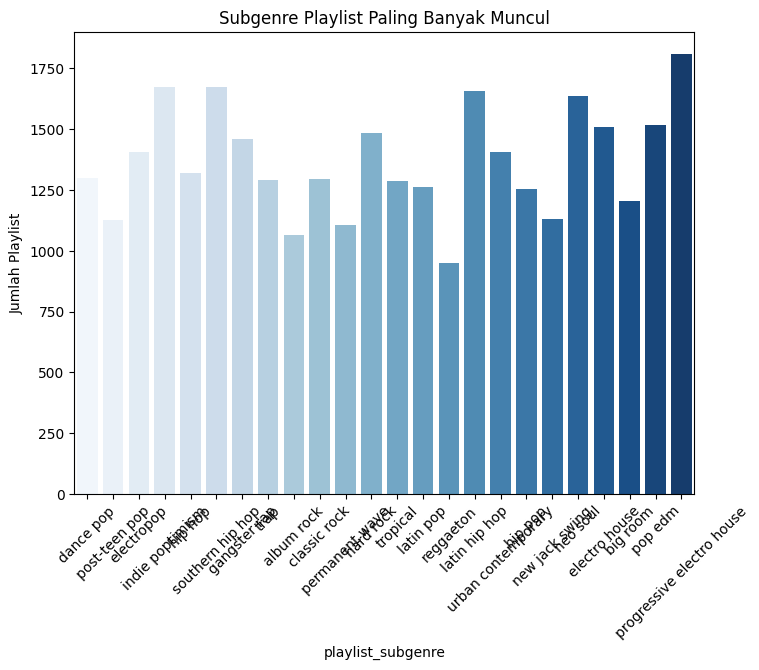

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(data=df, x='playlist_subgenre', palette='Blues')
plt.title('Subgenre Playlist Paling Banyak Muncul')
plt.xticks(rotation=45)
plt.ylabel('Jumlah Playlist')
plt.show()

#### 6. Genre playlist mana yang paling banyak digunakan dan yang paling banyak muncul?

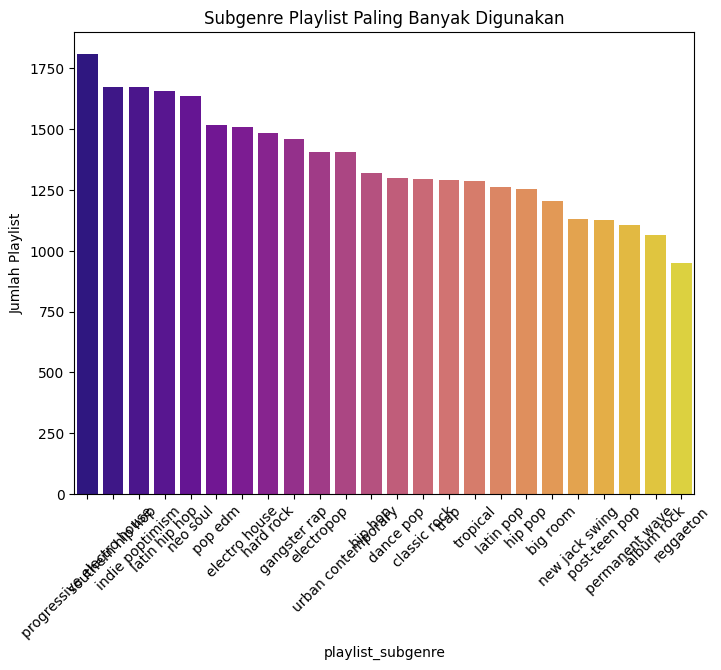

In [ ]:
subgenre_count = df['playlist_subgenre'].value_counts()
plt.figure(figsize=(8,6))
sns.barplot(x=subgenre_count.index, y=subgenre_count.values, palette='plasma')
plt.title('Subgenre Playlist Paling Banyak Digunakan')
plt.xticks(rotation=45)
plt.ylabel('Jumlah Playlist')
plt.show()

#### 7. Popolaritas lagu berdasarkan subgenre playlist?

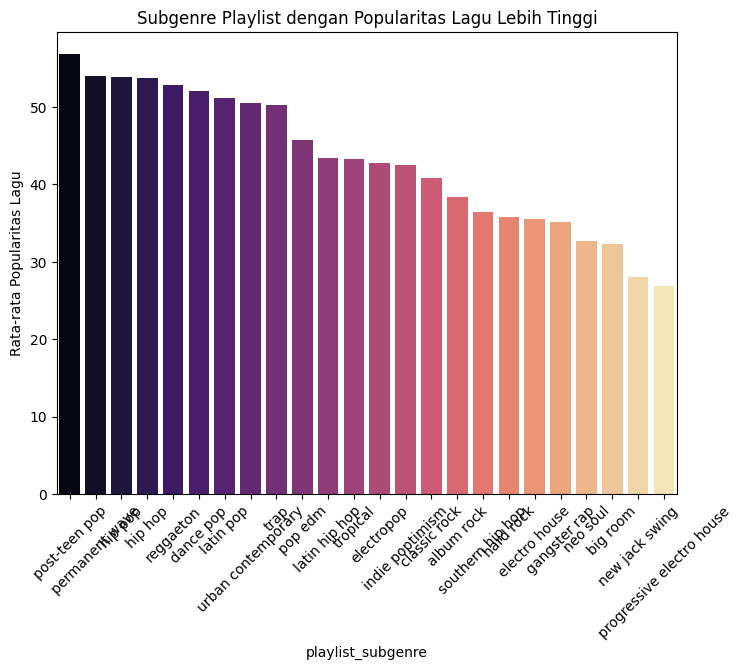

In [ ]:
subgenre_popularity = df.groupby('playlist_subgenre')['track_popularity'].mean().sort_values(ascending=False)
plt.figure(figsize=(8,6))
sns.barplot(x=subgenre_popularity.index, y=subgenre_popularity.values, palette='magma')
plt.title('Subgenre Playlist dengan Popularitas Lagu Lebih Tinggi')
plt.ylabel('Rata-rata Popularitas Lagu')
plt.xticks(rotation=45)
plt.show()

#### 8. Jenis playlist mana yang paling sibuk atau memiliki paling banyak lagu?

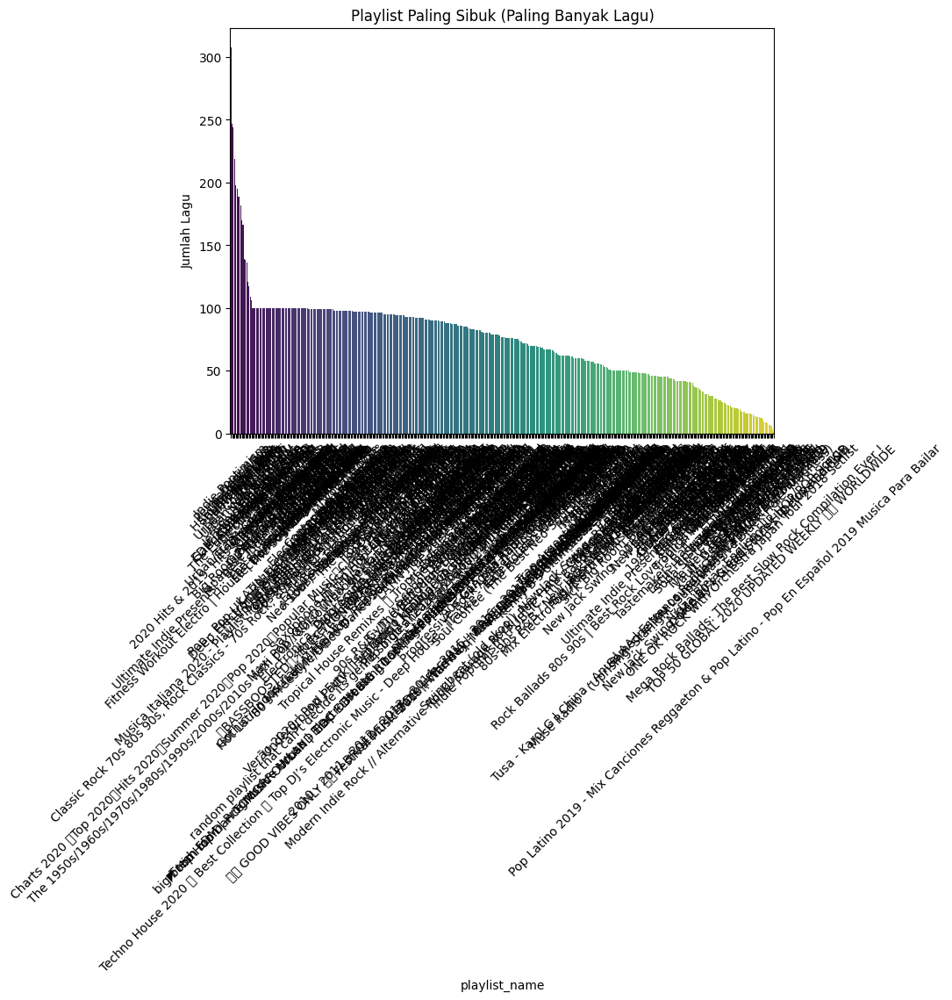

In [ ]:
playlist_count = df['playlist_name'].value_counts()
plt.figure(figsize=(8,6))
sns.barplot(x=playlist_count.index, y=playlist_count.values, palette='viridis')
plt.title('Playlist Paling Sibuk (Paling Banyak Lagu)')
plt.ylabel('Jumlah Lagu')
plt.xticks(rotation=45)
plt.show()

#### 9. Waktu rilis album mana yang paling sering terjadi?

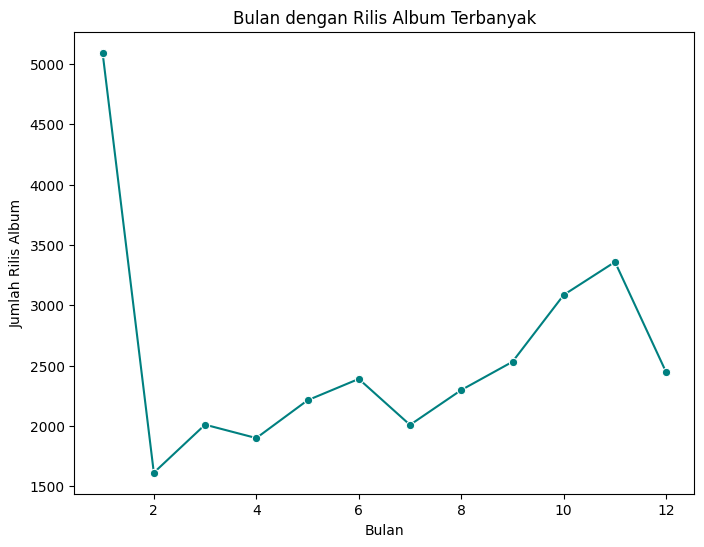

In [ ]:
df['track_album_release_date'] = pd.to_datetime(df['track_album_release_date'], errors='coerce')
df['release_month'] = df['track_album_release_date'].dt.month
release_month_count = df['release_month'].value_counts().sort_index()

plt.figure(figsize=(8,6))
sns.lineplot(x=release_month_count.index, y=release_month_count.values, marker='o', color='teal')
plt.title('Bulan dengan Rilis Album Terbanyak')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Rilis Album')
plt.show()

#### 10. Genre playlist mana yang memiliki lagu dengan popularitas lebih tinggi?

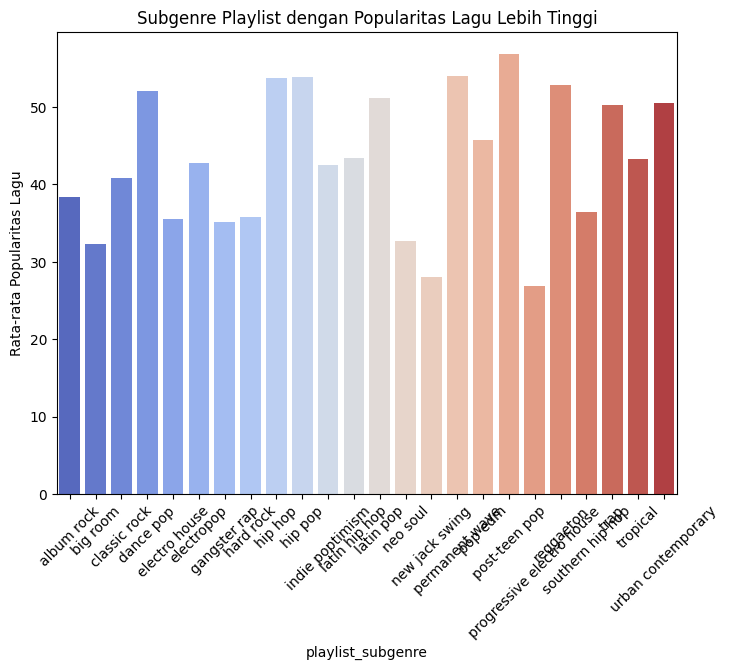

In [ ]:
genre_popularity = df.groupby('playlist_subgenre')['track_popularity'].mean()
plt.figure(figsize=(8,6))
sns.barplot(x=genre_popularity.index, y=genre_popularity.values, palette='coolwarm')
plt.title('Subgenre Playlist dengan Popularitas Lagu Lebih Tinggi')
plt.ylabel('Rata-rata Popularitas Lagu')
plt.xticks(rotation=45)
plt.show()

#### 11. Durasi lagu paling umum berdasarkan genre?

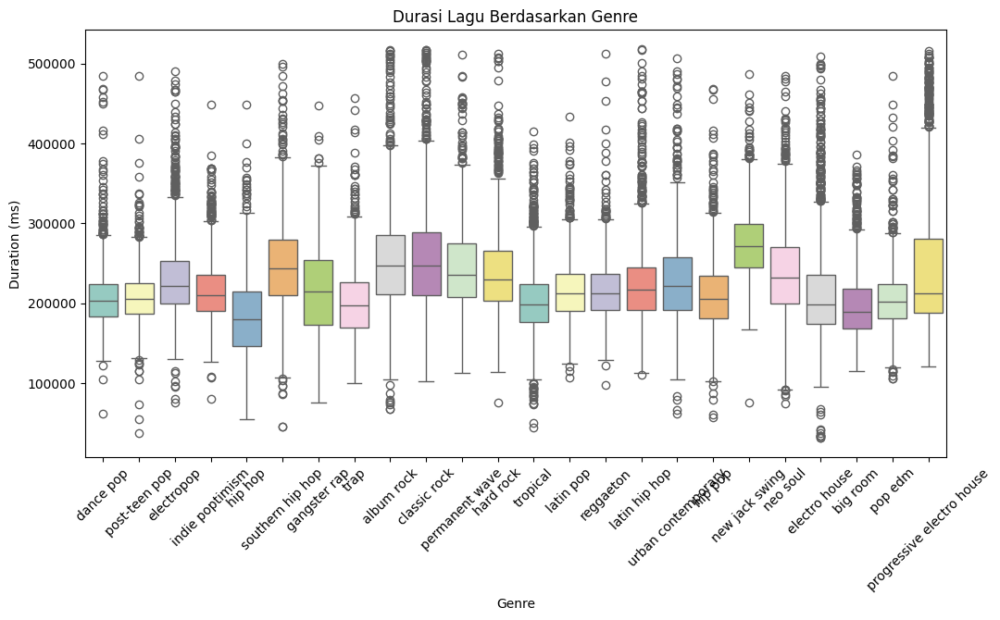

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=new_df, x='playlist_subgenre', y='duration_ms', palette='Set3') # Changed df to new_df and playlist_genre to playlist_subgenre
plt.title('Durasi Lagu Berdasarkan Genre')
plt.xlabel('Genre')
plt.ylabel('Duration (ms)')
plt.xticks(rotation=45)
plt.show()

#### 12. Durasi lagu yang paling umum dengan frekuensi waktu?

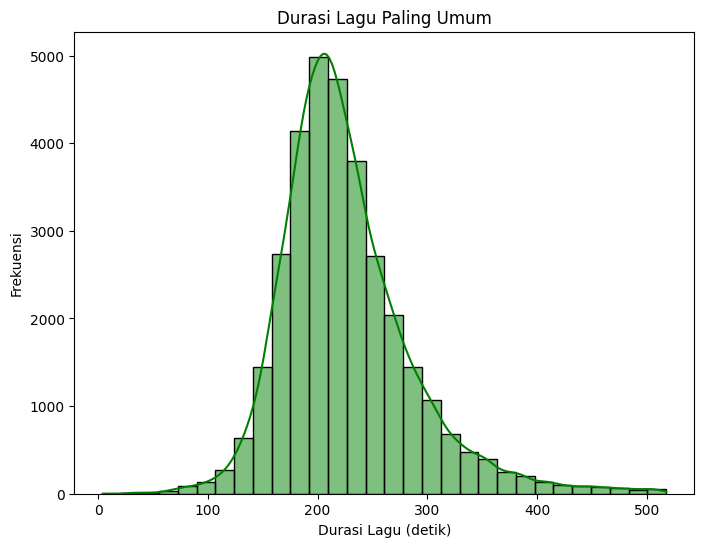

In [ ]:
plt.figure(figsize=(8,6))
sns.histplot(df['duration_ms'] / 1000, kde=True, color='green', bins=30)
plt.title('Durasi Lagu Paling Umum')
plt.xlabel('Durasi Lagu (detik)')
plt.ylabel('Frekuensi')
plt.show()

#### 13. Apakah popularitas lagu dipengaruhi oleh subgenre playlist?

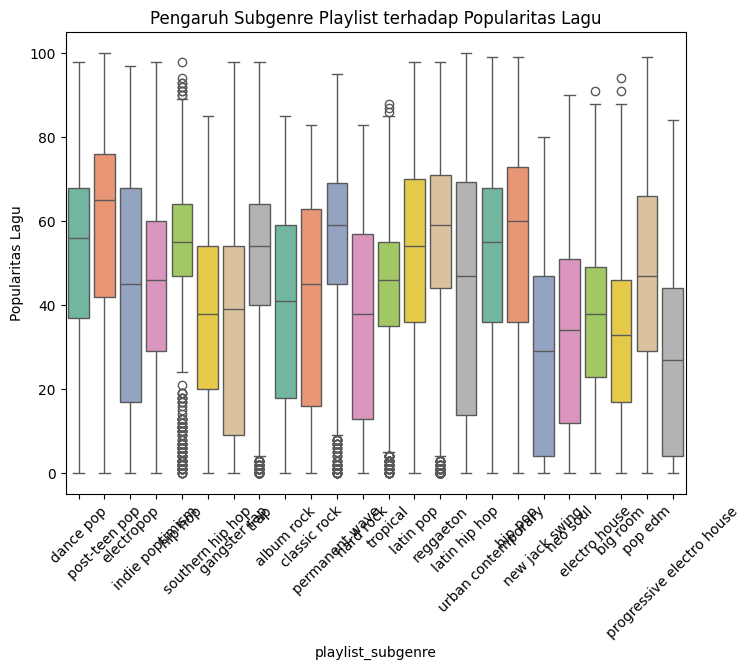

In [ ]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df, x='playlist_subgenre', y='track_popularity', palette='Set2')
plt.title('Pengaruh Subgenre Playlist terhadap Popularitas Lagu')
plt.ylabel('Popularitas Lagu')
plt.xticks(rotation=45)
plt.show()

#### 14. Durasi lagu rata-rata dan lagu dengan popularitas rendah?

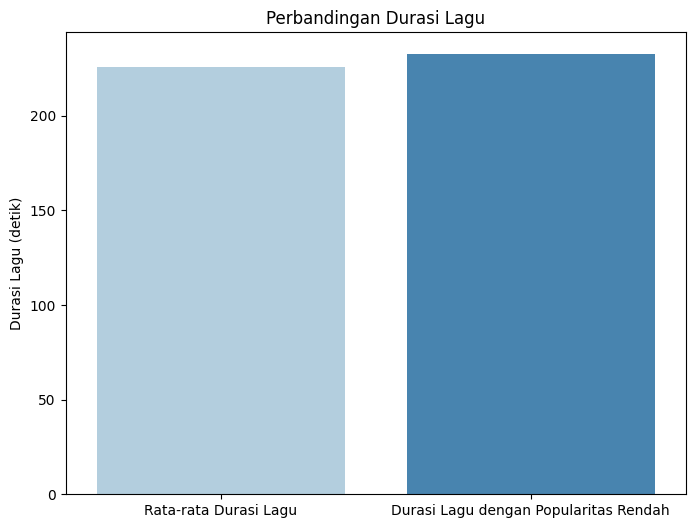

In [ ]:
avg_duration = df['duration_ms'].mean() / 1000
low_popularity_duration = df[df['track_popularity'] < df['track_popularity'].median()]['duration_ms'].mean() / 1000

fig, ax = plt.subplots(figsize=(8,6))
sns.barplot(x=['Rata-rata Durasi Lagu', 'Durasi Lagu dengan Popularitas Rendah'], y=[avg_duration, low_popularity_duration], palette='Blues')
plt.title('Perbandingan Durasi Lagu')
plt.ylabel('Durasi Lagu (detik)')
plt.show()

#### 15. Bagaimana korelasi antar fitur numerik di sportify data?

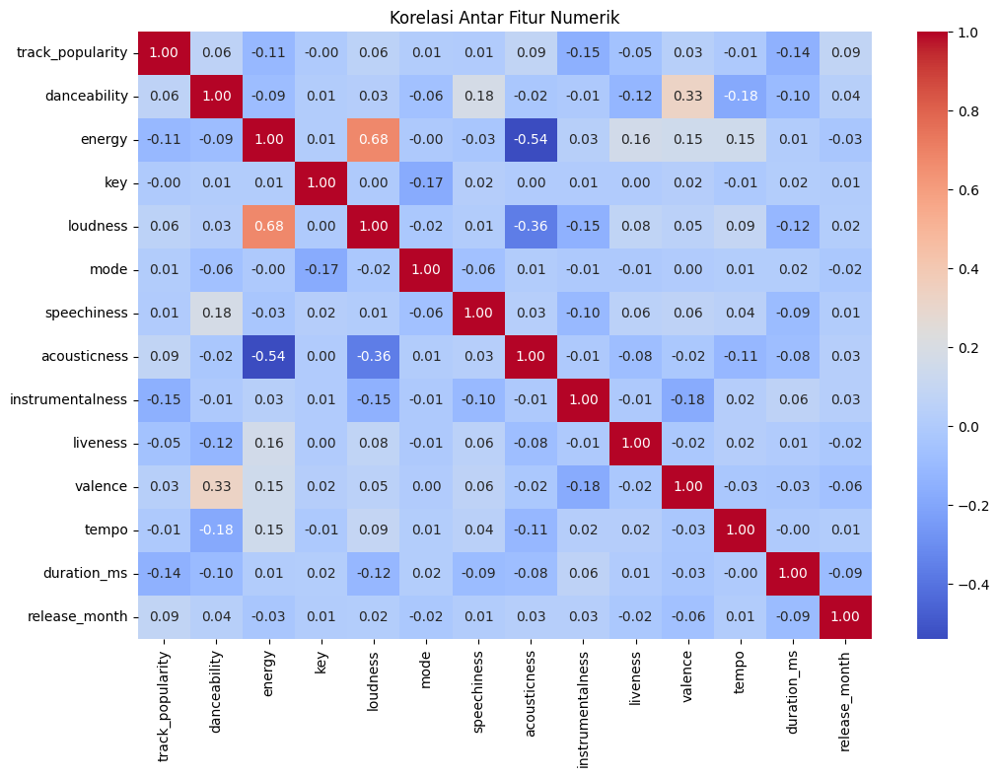

In [ ]:
plt.figure(figsize=(12, 8))

numeric_df = df.select_dtypes(include=np.number)

sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Korelasi Antar Fitur Numerik')
plt.show()

#### Kolom Kategorikal dan Numerik

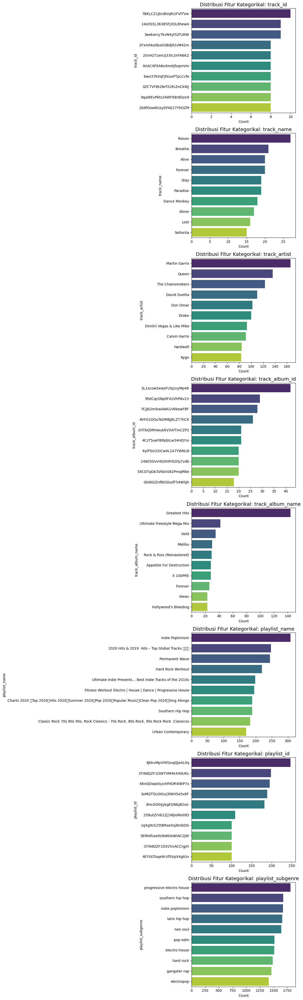

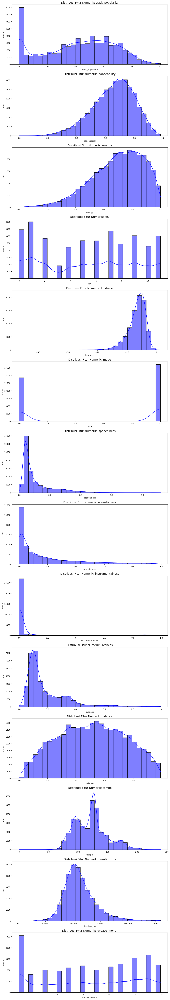

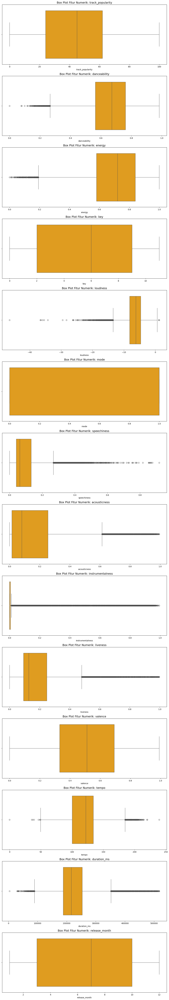

In [ ]:
# Menentukan kolom kategorikal dan numerik
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Visualisasi untuk fitur kategorikal
plt.figure(figsize=(12, len(categorical_columns) * 5))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(len(categorical_columns), 1, i)
    value_counts = df[col].value_counts().head(10)  # Tampilkan 10 nilai teratas
    sns.barplot(y=value_counts.index, x=value_counts.values, palette='viridis')
    plt.title(f'Distribusi Fitur Kategorikal: {col}', fontsize=14)
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# Visualisasi untuk fitur numerik
plt.figure(figsize=(12, len(numerical_columns) * 5))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 1, i)
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Distribusi Fitur Numerik: {col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Box plot untuk fitur numerik (melihat outliers)
plt.figure(figsize=(12, len(numerical_columns) * 5))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 1, i)
    sns.boxplot(x=df[col], color='orange')
    plt.title(f'Box Plot Fitur Numerik: {col}', fontsize=14)
    plt.xlabel(col)
plt.tight_layout()
plt.show()

### MULTIVARIATE ANALYSIS

#### 1. CORRELATION HEATMAP

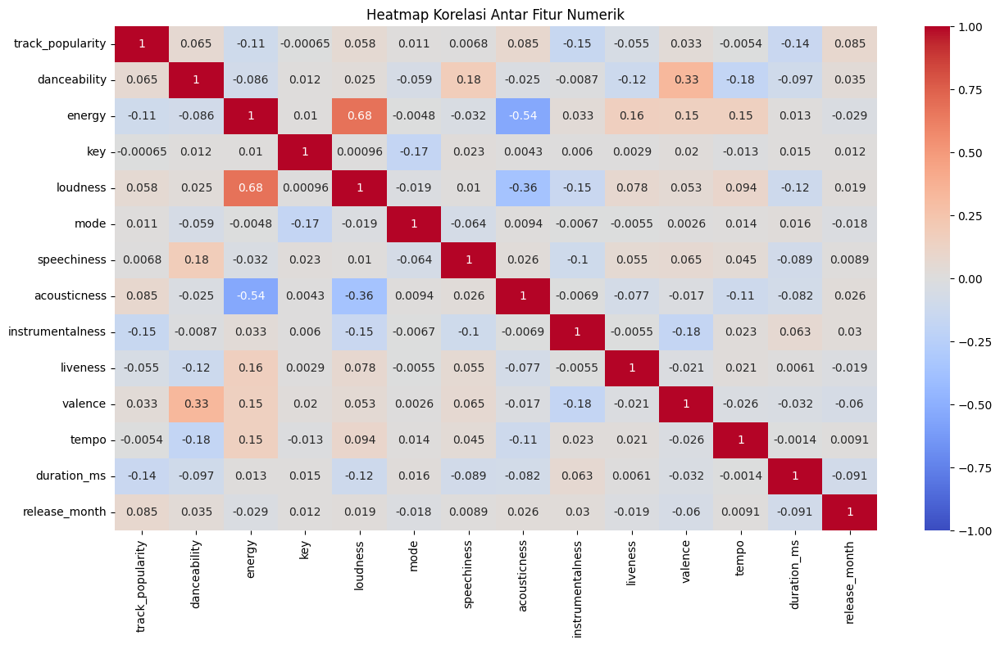

In [ ]:
# Memilih hanya kolom numerik dari dataset
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Membuat heatmap korelasi
plt.figure(figsize=(15,8))
sns.heatmap(numeric_df.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot=True)
plt.title('Heatmap Korelasi Antar Fitur Numerik')
plt.show()


#### 2. PAIR PLOT

<Figure size 1200x1000 with 0 Axes>

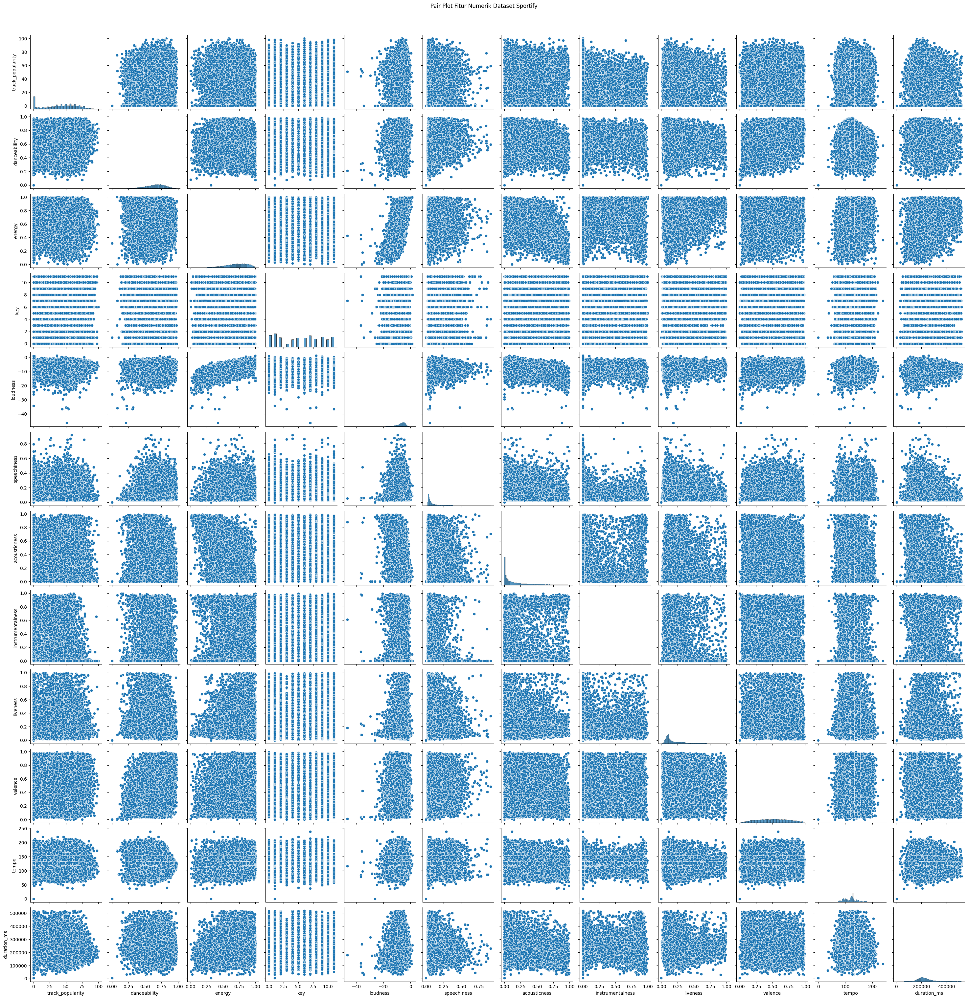

In [ ]:
# Memilih kolom numerik yang relevan
numerical_features = ['track_popularity', 'danceability', 'energy',
                      'key', 'loudness', 'speechiness', 'acousticness',
                      'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

new_df2 = df[numerical_features]

# Plotting pair plot untuk kolom numerik
plt.figure(figsize=(12,10))
sns.pairplot(new_df2)
plt.suptitle('Pair Plot Fitur Numerik Dataset Sportify', y=1.02)  # Menambahkan judul
plt.show()


##**INSIGHTS N OBSERVATIONS**

> *   Missing Values: Dataset memiliki nilai hilang di beberapa kolom kategorikal, yang diisi dengan modus dari masing-masing kolom.
*   Outlier: Outlier dalam variabel kontinu ditangani menggunakan metode Rentang Interkuartil (IQR), memastikan analisis yang lebih robust.
*   Genre Popularity: Genre dan subgenre tertentu menunjukkan skor popularitas rata-rata yang lebih tinggi, mengindikasikan preferensi pendengar.
*   Energy Popularity: Ditemukan korelasi positif antara tingkat energi dan popularitas lagu, menunjukkan bahwa lagu yang lebih energik cenderung lebih populer.
*   Tren Rilis: Analisis tanggal rilis album mengungkapkan bulan-bulan tertentu dengan frekuensi rilis yang lebih tinggi, yang dapat menginformasikan strategi pemasaran.
*   Distribusi Genre : Genre pop dan hip-hop mendominasi dalam hal popularitas, sementara genre lain seperti country dan jazz memiliki popularitas yang lebih rendah.
*   Durasi Lagu : Durasi lagu yang paling umum adalah antara 3-4 menit, yang merupakan standar untuk banyak lagu populer.






##**SOLUTIONS BUSINESS OBJECTIVE**

> *   Pembuatan Playlist: Gunakan wawasan tentang genre dan subgenre yang populer untuk mengkurasi playlist yang sesuai dengan preferensi pendengar.
*   Strategi Pemasaran: Fokus pada promosi lagu dengan energi dan danceability tinggi, karena fitur-fitur ini berkorelasi dengan popularitas yang lebih tinggi.
*   Waktu Rilis: Jadwalkan rilis baru selama bulan-bulan puncak yang diidentifikasi dalam analisis untuk memaksimalkan visibilitas dan keterlibatan pendengar.





##**FUTURE WORK**

> *   Analisis prediksi tren popularitas lagu berdasarkan fitur audio.
*   Menerapkan sistem untuk analisis data waktu nyata agar tetap mengikuti perubahan tren musik.
*   Mengintegrasikan umpan balik pengguna dan kebiasaan mendengarkan untuk analisis yang lebih komprehensif.





##**CONCLUSION**

> Analisis dataset lagu Spotify memberikan wawasan berharga tentang faktor-faktor yang mempengaruhi popularitas lagu dan preferensi pendengar. Dengan memahami hubungan antara fitur audio dan popularitas, serta distribusi genre, para pemangku kepentingan dapat membuat keputusan yang lebih baik terkait promosi musik dan pembuatan playlist.



##**CHALLENGES**

> *   Kualitas Data: Adanya nilai hilang dan outlier memerlukan penanganan yang hati-hati untuk memastikan integritas analisis.
*   Hubungan yang Kompleks: Memahami hubungan multifaset antara berbagai fitur audio dan popularitas memerlukan teknik statistik yang lebih canggih.
*   Sifat Dinamis Tren Musik: Tren musik dapat berubah dengan cepat, sehingga penting untuk terus memperbarui analisis dengan data baru.



